# Overview
Use this jupyter-stle notebook to test out exploratory analysis before deploying via streamlit. 

# Setup and imports
Gather libraries for analysis

In [1]:
# Install the Pyscopg Postgre SQL adaptor for Python
#Use the Streamlit Virtual environment for this install

#pip install psycopg2-binary
#Documentation can be found at  https://www.psycopg.org/docs/
#It is recomended to use psycopg2 for production packages
#--->UPDATE in next .V
import psycopg2 as psg


#Import standard analysis tools
import pandas as pd
import numpy as np 
import datetime as dt


#Import graphing tools
import matplotlib.pyplot as plt 
import seaborn as sns
import plotly.express as px 
import plotly.graph_objects as go 

# Exploratory Analysis
The NIBRS dataset is large (hundreds of gigs).  To make things easier, it has been broken down into downloadable Postgre SQL databases divided by state and year.  In this notebook I explore data from my homestate MN in 2022.  This work should be reproducible for any state and any time period(assuming data exists) as the DB structure should be the same.  

Becuase there is many different ways to load and interpret this data, I will show two example that I found interesting.  This strategy could be adopted to show other trends as needed.

## Explore 'Offense' type frequency

NIBRS offense codes: [https://ucr.fbi.gov/nibrs/2011/resources/nibrs-offense-codes](https://ucr.fbi.gov/nibrs/2011/resources/nibrs-offense-codes)

Understanding how the data is collected is important when doing any analysis.  In this case, the NIBRS user manual can be found here : [https://le.fbi.gov/file-repository/nibrs-user-manual.pdf](https://le.fbi.gov/file-repository/nibrs-user-manual.pdf)

**Offense Vs. Incident** - FBI’s UCR Program defines an incident as one or more offenses committed by the same offender, or group of offenders acting in concert, at the same time and place.  That is, there can be mulitple offenses per incident.  This is important to note when considering the frequency of reported offenses.  


In [2]:
#Test Query - Lets look at the frequency of offenses by date
q = '''
    select ni.incident_date, ni.incident_hour, ni.incident_id, ni.agency_id, a.ncic_agency_name, no.offense_code, ne.ethnicity_name, rr.race_desc, nwt.weapon_name
    from nibrs_incident ni
    Right join nibrs_offense no on ni.incident_id = no.incident_id
    left join nibrs_offender noff on no.incident_id = noff.incident_id
    join nibrs_ethnicity ne on noff.ethnicity_id = ne.ethnicity_id
    join ref_race rr on noff.race_id = rr.race_id
    join agencies a on ni.agency_id = a.agency_id
    left join nibrs_weapon nw on no.offense_id = nw.offense_id
    left join nibrs_weapon_type nwt on nw.weapon_id=nwt.weapon_id
    '''



try:
    #establish conection to database
    conn = psg.connect(dbname="MN2022", user="postgres", password="1234", host='localhost', port =5432)

    # Open a cursor to perform database operations
    # cursor class allows interaction with the database
    cur = conn.cursor()
    print("PostgreSQL server information")
    print(conn.get_dsn_parameters(), "\n")

    # Execute a query
    cur.execute(q)

    # Retrieve query results
    df = pd.DataFrame(cur.fetchall())

    
#Collect Errors
except (Exception, Error) as error:
    print("Error while connecting to PostgreSQL", error)

#Close the Connection
finally:
    if (conn):
        cur.close()
        conn.close()
        print("PostgreSQL connection is closed")

PostgreSQL server information
{'user': 'postgres', 'channel_binding': 'prefer', 'dbname': 'MN2022', 'host': 'localhost', 'port': '5432', 'options': '', 'sslmode': 'prefer', 'sslcompression': '0', 'sslcertmode': 'allow', 'sslsni': '1', 'ssl_min_protocol_version': 'TLSv1.2', 'gssencmode': 'disable', 'krbsrvname': 'postgres', 'gssdelegation': '0', 'target_session_attrs': 'any', 'load_balance_hosts': 'disable'} 

PostgreSQL connection is closed


In [3]:
df.head()

,0,1,2,3,4,5,6,7,8
0,2022-02-02,10.0,149190867,9105,AITKIN CO SO AITKIN,26F,Not Specified,Not Specified,None
1,2022-02-06,10.0,151423357,9105,AITKIN CO SO AITKIN,240,Not Specified,Not Specified,None
2,2022-02-14,13.0,149243411,9105,AITKIN CO SO AITKIN,26F,Not Specified,Not Specified,None
3,2022-02-16,11.0,149243471,9105,AITKIN CO SO AITKIN,13C,Unknown,Unknown,None
4,2022-02-22,18.0,164830092,9105,AITKIN CO SO AITKIN,23H,Not Specified,Not Specified,None


In [4]:
#name the columns
df.columns = ["date","hour","incident","agencyID", "agency_name","type", "ethnicity", "race","weapon"]
#Add the weekday for grouping
# Convert the integer to english representation
df['weekday'] = df["date"].dt.strftime("%A")

#filter for type 290
filter = df[df["type"]=="290"].copy()

print(df.shape)
df.head()

(292082, 10)


,date,hour,incident,agencyID,agency_name,type,ethnicity,race,weapon,weekday
0,2022-02-02,10.0,149190867,9105,AITKIN CO SO AITKIN,26F,Not Specified,Not Specified,None,Wednesday
1,2022-02-06,10.0,151423357,9105,AITKIN CO SO AITKIN,240,Not Specified,Not Specified,None,Sunday
2,2022-02-14,13.0,149243411,9105,AITKIN CO SO AITKIN,26F,Not Specified,Not Specified,None,Monday
3,2022-02-16,11.0,149243471,9105,AITKIN CO SO AITKIN,13C,Unknown,Unknown,None,Wednesday
4,2022-02-22,18.0,164830092,9105,AITKIN CO SO AITKIN,23H,Not Specified,Not Specified,None,Tuesday


In [5]:
#take a look at which incident type is occuring most freq.
df["type"].value_counts()

type
290    34047
23H    27534
35A    24071
13B    24069
23C    23505
240    18379
23F    18161
23G    13894
220    13734
13A    10890
35B    10270
13C     9114
520     8964
26A     7658
23D     7209
280     6583
120     5958
26F     5838
26B     5475
250     4283
11D     2483
11A     1996
370     1171
26C     1116
200      683
100      672
23B      620
26E      514
23A      491
210      383
720      366
270      342
26D      329
11B      314
09A      294
26G      158
11C      137
64A      101
40C       96
09B       62
40A       29
39B       20
09C       18
23E       15
64B        9
39A        8
510        7
40B        5
36A        5
36B        2
Name: count, dtype: int64

In [6]:
#overall incident trend
trend = df.groupby("date")["incident"].count()

In [7]:
filter.head()

,date,hour,incident,agencyID,agency_name,type,ethnicity,race,weapon,weekday
22,2022-02-10,16.0,149502670,9202,CANNON FALLS PD,290,Not Hispanic or Latino,White,None,Thursday
23,2022-02-10,16.0,149502670,9202,CANNON FALLS PD,290,Not Hispanic or Latino,White,None,Thursday
27,2022-05-20,11.0,154075112,9105,AITKIN CO SO AITKIN,290,Not Hispanic or Latino,White,None,Friday
31,2022-05-26,8.0,154075137,9105,AITKIN CO SO AITKIN,290,Not Specified,Not Specified,None,Thursday
34,2022-04-28,22.0,153352566,9202,CANNON FALLS PD,290,Not Specified,Not Specified,None,Thursday


### Agency data

In [39]:
agencies = filter.groupby("agency_name")["incident"].count().nlargest(1)
print(agencies)
print(agencies.index[0])
print(agencies[0])

agency_name
MINNEAPOLIS PD    3499
Name: incident, dtype: int64
MINNEAPOLIS PD
3499


C:\Users\jonme\AppData\Local\Temp\ipykernel_27740\2194752993.py:4: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



### Time trends

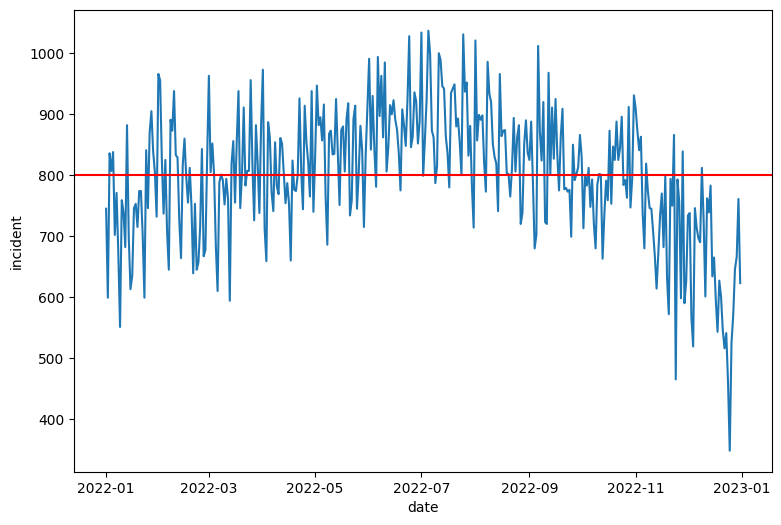

In [8]:
fig, axes = plt.subplots(figsize=(9,6))
sns.lineplot(data = trend)
plt.axhline(trend.mean(), color='red')

In [9]:
trend_290 = df[df["type"]=="290"].groupby("date")["incident"].count()

In [41]:
px.line(data_frame=filter[['date','incident']], x='date',y='incident', labels={"Date", "Count"}, title=f"Offense: ")

<Axes: xlabel='date', ylabel='incident'>

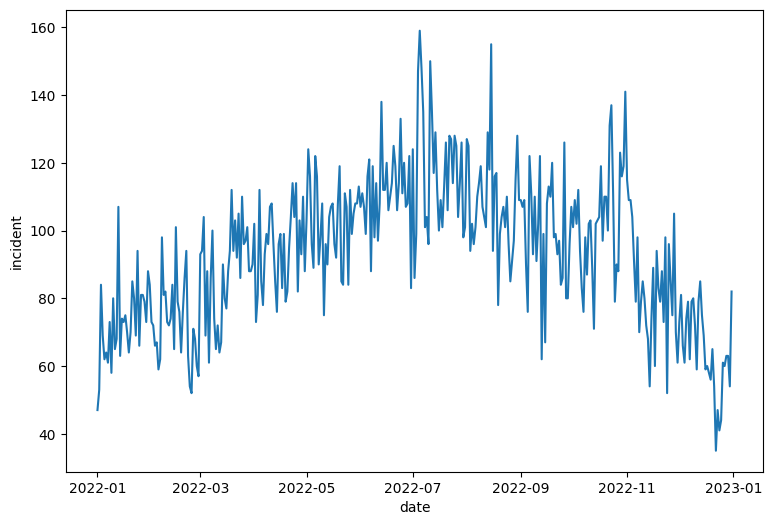

In [10]:
fig, axes = plt.subplots(figsize=(9,6))
sns.lineplot(data = trend_290)

### Does the weekday matter?

In [12]:
fig1 = px.histogram(data_frame=filter[["incident", "weekday"]], x="weekday", y="incident", histfunc='count')
fig1.show()

### Does the time matter?

In [13]:
fig2 = px.histogram(data_frame=filter[["incident", "hour"]], x="hour", y="incident", histfunc='count')
fig2.show()

### Plot  Race / Weapons used / drugs?

In [15]:
df.groupby("race")["incident"].count()

race
American Indian or Alaska Native              8488
Asian                                         3323
Black or African American                    56408
Native Hawaiian or Other Pacific Islander      267
Not Specified                                82591
Unknown                                      68897
White                                        71002
Name: incident, dtype: int64

In [16]:
fig = px.pie(data_frame=df[["incident","race"]], names='race', values='incident' )
fig.show()

In [51]:
filter[["incident","race"]]

,incident,race
12,152437456,White
44,165578473,White
56,165578632,American Indian or Alaska Native
84,154056156,White
128,153633495,Black or African American
...,...,...
291981,153561995,White
292004,167385756,White
292037,165778495,Black or African American
292045,159250436,White


In [58]:
#print(filter['race'].unique())
race_pie = filter['race'].value_counts()
print(filter['race'].unique())
print(race_pie.values[:])

['White' 'American Indian or Alaska Native' 'Black or African American'
 'Unknown' 'Not Specified' 'Native Hawaiian or Other Pacific Islander'
 'Asian']
[4508 3163 2020  496  493  190   20]


### Weapon

In [11]:
#filter for type 290
filter = df[df["type"]=="13A"].copy()
filter.groupby('weapon')['incident'].count()

weapon
Asphyxiation                       163
Blunt Object                       916
Drugs/Narcotics/Sleeping Pills      20
Explosives                          25
Fire/Incendiary Device              21
Firearm                           1111
Firearm (Automatic)                 78
Handgun                           1908
Handgun (Automatic)                182
Knife/Cutting Instrument          2033
Motor Vehicle/Vessel               369
None                               491
Other                              662
Other Firearm                      138
Other Firearm (Automatic)            5
Personal Weapons                  2330
Poison                               3
Rifle                               60
Rifle (Automatic)                    7
Shotgun                             66
Shotgun (Automatic)                  5
Unknown                            297
Name: incident, dtype: int64

In [12]:
# Weapon pie chart
#fig2 = px.histogram(data_frame=filter[["incident", "hour"]], x="hour", y="incident", histfunc='count')
fig = px.pie(data_frame=filter[["incident","weapon"]], names='weapon', values='incident' )
fig.show()

### Agency info

In [18]:
df.groupby("agency_name")["incident"].count().sort_values(ascending=False)

agency_name
MINNEAPOLIS PD                     52436
ST PAUL PD                         28810
BLOOMINGTON PD                      7397
BROOKLYN PARK PD                    6845
ST CLOUD PD ST CLOUD                6599
                                   ...  
SPRINGFIELD PD                         4
LAKEFIELD PD                           2
CLARA CITY PD                          2
DPS-SP METRO DISPATCH ROSEVILLE        2
MONTEVIDEO PD                          2
Name: incident, Length: 317, dtype: int64

In [19]:
sorted = df.groupby("agency_name")["incident"].count().sort_values(ascending=False)

In [20]:
type(sorted)

pandas.core.series.Series